# **Bridge Material and Design Analysis in Virginia, Washington, Texas and District of Columbia**

## **Load Data into Databricks**

The dataset taken from InfoBridge on 12/27/25, which contains information for bridges from District of Columbia, Texas, Virginia, and Washington

In [0]:
# Load data into Spark
df_csv = spark.read.csv("/Volumes/workspace/default/bridge/Selected_Bridges_December_27_2025_12_08_20.csv",
    header=True,
    inferSchema=True,
    sep=",")
display(df_csv) 

1 - State Code,1 - State Name,8 - Structure Number,22 - Owner Agency,3 - County Code,3 - County Name,4 - Place Code,City - InfoBridge Place Code,City - InfoBridge Place Name,27 - Year Built,29 - Average Daily Traffic,43A - Main Span Material,43B - Main Span Design,45 - Number of Spans in Main Unit,49 - Structure Length (ft.),6A - Features Intersected,7 - Facility Carried By Structure,CAT10 - Bridge Condition,Bridge Age (yr),CAT29 - Deck Area (sq. ft.)
11,District of Columbia,0132,State Highway Agency,1,District of Columbia,0,0,No Place Code,1959,5500,Steel,Stringer/Multi-beam or Girder,1,39.4,WATTS BRANCH NE,58TH STREET N.E.,Good,66,2170.0
11,District of Columbia,0027,State Highway Agency,1,District of Columbia,0,0,No Place Code,1932,28338,Steel,Arch - Deck,1,497.0,KLINGLE VALLEY,CONNECTICUT AVE.,Fair,93,40442.1
11,District of Columbia,0196,State Highway Agency,1,District of Columbia,0,50000,Washington city,1958,5000,Prestressed Concrete,Box Beam or Girders - Multiple,1,33.1,WATTS BRANCH,"55TH STREET, N.E.",Fair,67,1587.2
11,District of Columbia,0204,State Highway Agency,1,District of Columbia,0,50000,Washington city,1951,6827,Steel,Stringer/Multi-beam or Girder,1,39.7,WATTS BRANCH,DIVISION AVENUE,Good,74,2096.9
11,District of Columbia,0129,State Highway Agency,1,District of Columbia,0,50000,Washington city,1956,6900,Steel,Stringer/Multi-beam or Girder,1,45.6,WATTS BRANCH,44TH STREET N.E.,Good,69,2094.7
11,District of Columbia,0070,State Highway Agency,1,District of Columbia,0,50000,Washington city,1976,17800,Prestressed Concrete,Box Beam or Girders - Multiple,3,413.1,SUITLAND PARKWAY,SOUTHERN AVENUE,Good,49,24799.7
11,District of Columbia,0222,State Highway Agency,1,District of Columbia,0,50000,Washington city,1956,3000,Steel,Stringer/Multi-beam or Girder,1,64.6,WATTS BRANCH,GAULT PLACE,Good,69,2735.4
11,District of Columbia,0045,State Highway Agency,1,District of Columbia,0,0,No Place Code,1957,21900,Steel Continuous,Stringer/Multi-beam or Girder,2,89.6,Kenilworth Ave,Eastern Avenue,Good,68,16132.6
11,District of Columbia,0128,State Highway Agency,1,District of Columbia,0,50000,Washington city,1915,2500,Concrete,Stringer/Multi-beam or Girder,1,41.0,WATTS BRANCH,"HUNT PLACE, N.E.",Good,110,2031.7
11,District of Columbia,0065,State Highway Agency,1,District of Columbia,0,50000,Washington city,1971,17000,Steel,Stringer/Multi-beam or Girder,1,102.0,OXON RUN,SOUTHERN AVENUE,Fair,54,6025.6


%md
## **Standardize Columns**

In [0]:
df_csv_standardized = df_csv.toDF(*[col.replace(" ", "_").replace("-", "_").replace(".", "").replace("(", "").replace(")", "") for col in df_csv.columns])
display(df_csv_standardized)

1___State_Code,1___State_Name,8___Structure_Number,22___Owner_Agency,3___County_Code,3___County_Name,4___Place_Code,City___InfoBridge_Place_Code,City___InfoBridge_Place_Name,27___Year_Built,29___Average_Daily_Traffic,43A___Main_Span_Material,43B___Main_Span_Design,45___Number_of_Spans_in_Main_Unit,49___Structure_Length_ft,6A___Features_Intersected,7___Facility_Carried_By_Structure,CAT10___Bridge_Condition,Bridge_Age_yr,CAT29___Deck_Area_sq_ft
11,District of Columbia,0132,State Highway Agency,1,District of Columbia,0,0,No Place Code,1959,5500,Steel,Stringer/Multi-beam or Girder,1,39.4,WATTS BRANCH NE,58TH STREET N.E.,Good,66,2170.0
11,District of Columbia,0027,State Highway Agency,1,District of Columbia,0,0,No Place Code,1932,28338,Steel,Arch - Deck,1,497.0,KLINGLE VALLEY,CONNECTICUT AVE.,Fair,93,40442.1
11,District of Columbia,0196,State Highway Agency,1,District of Columbia,0,50000,Washington city,1958,5000,Prestressed Concrete,Box Beam or Girders - Multiple,1,33.1,WATTS BRANCH,"55TH STREET, N.E.",Fair,67,1587.2
11,District of Columbia,0204,State Highway Agency,1,District of Columbia,0,50000,Washington city,1951,6827,Steel,Stringer/Multi-beam or Girder,1,39.7,WATTS BRANCH,DIVISION AVENUE,Good,74,2096.9
11,District of Columbia,0129,State Highway Agency,1,District of Columbia,0,50000,Washington city,1956,6900,Steel,Stringer/Multi-beam or Girder,1,45.6,WATTS BRANCH,44TH STREET N.E.,Good,69,2094.7
11,District of Columbia,0070,State Highway Agency,1,District of Columbia,0,50000,Washington city,1976,17800,Prestressed Concrete,Box Beam or Girders - Multiple,3,413.1,SUITLAND PARKWAY,SOUTHERN AVENUE,Good,49,24799.7
11,District of Columbia,0222,State Highway Agency,1,District of Columbia,0,50000,Washington city,1956,3000,Steel,Stringer/Multi-beam or Girder,1,64.6,WATTS BRANCH,GAULT PLACE,Good,69,2735.4
11,District of Columbia,0045,State Highway Agency,1,District of Columbia,0,0,No Place Code,1957,21900,Steel Continuous,Stringer/Multi-beam or Girder,2,89.6,Kenilworth Ave,Eastern Avenue,Good,68,16132.6
11,District of Columbia,0128,State Highway Agency,1,District of Columbia,0,50000,Washington city,1915,2500,Concrete,Stringer/Multi-beam or Girder,1,41.0,WATTS BRANCH,"HUNT PLACE, N.E.",Good,110,2031.7
11,District of Columbia,0065,State Highway Agency,1,District of Columbia,0,50000,Washington city,1971,17000,Steel,Stringer/Multi-beam or Girder,1,102.0,OXON RUN,SOUTHERN AVENUE,Fair,54,6025.6


In [0]:
# Transform to Pandas DataFrame
# Display column names
import pandas as pd
display(pd.DataFrame(df_csv_standardized.columns, columns=["Column Name"]))

,Column Name
0,1___State_Code
1,1___State_Name
2,8___Structure_Number
3,22___Owner_Agency
4,3___County_Code
5,3___County_Name
6,4___Place_Code
7,City___InfoBridge_Place_Code
8,City___InfoBridge_Place_Name
9,27___Year_Built


In [0]:
 # Create a new Spark DataFrame with selected columns for further analysis
 df_new = df_csv_standardized.select(
        [
            "1___State_Code",
            "1___State_Name",
            "8___Structure_Number",
            "22___Owner_Agency",
            "43A___Main_Span_Material",
            "43B___Main_Span_Design"
        ]
    )
display(df_new)

1___State_Code,1___State_Name,8___Structure_Number,22___Owner_Agency,43A___Main_Span_Material,43B___Main_Span_Design
11,District of Columbia,0132,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0027,State Highway Agency,Steel,Arch - Deck
11,District of Columbia,0196,State Highway Agency,Prestressed Concrete,Box Beam or Girders - Multiple
11,District of Columbia,0204,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0129,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0070,State Highway Agency,Prestressed Concrete,Box Beam or Girders - Multiple
11,District of Columbia,0222,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0045,State Highway Agency,Steel Continuous,Stringer/Multi-beam or Girder
11,District of Columbia,0128,State Highway Agency,Concrete,Stringer/Multi-beam or Girder
11,District of Columbia,0065,State Highway Agency,Steel,Stringer/Multi-beam or Girder


In [0]:
# Summary Statistics
display(df_new.describe())

summary,1___State_Code,1___State_Name,8___Structure_Number,22___Owner_Agency,43A___Main_Span_Material,43B___Main_Span_Design
count,79875,79875,79875,79872,79872,79872
mean,48.94362441314554,null,Infinity,null,null,null
stddev,2.800583404456705,null,NaN,null,null,null
min,11,District of Columbia,1VA0075,Air Force,"Aluminum, Wrought Iron or Cast Iron",Arch - Deck
max,53,Washington,NCA6,Zoo/Smithsonian,Wood or Timber,Truss - Thru


##**Data Cleaning**

In [0]:
# Transform to Pandas DataFrame
# Check for duplicate values 
df_pd = df_new.toPandas()
df_pd.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
79870    False
79871    False
79872    False
79873    False
79874    False
Length: 79875, dtype: bool

**There are no duplicate values in this dataset**

In [0]:
# Check for missing values
missing_values = df_pd.isnull().sum()
missing_values

1___State_Code              0
1___State_Name              0
8___Structure_Number        0
22___Owner_Agency           3
43A___Main_Span_Material    3
43B___Main_Span_Design      3
dtype: int64

**Since Main_Span_Material and Main_Span_Design are the primary variables of interest in this analysis, records missing either attribute cannot meaningfully contribute to the study.
Inputing values for these structural characteristics would introduce artificial material-design combinations and may result in systematic bias. To preserve the integrity of the material-design analysis, observations with missing values in these variables were therefore excluded from the dataset.**

In [0]:
# Dop rows that contain missing values in  '43A___Main_Span_Material' and '43B___Main_Span_Design'
df_pd = df_pd.dropna(subset=['43A___Main_Span_Material', '43B___Main_Span_Design'])

# Check again for missing values
missing_values = df_pd.isnull().sum()
missing_values

1___State_Code              0
1___State_Name              0
8___Structure_Number        0
22___Owner_Agency           0
43A___Main_Span_Material    0
43B___Main_Span_Design      0
dtype: int64

In [0]:
display(df_pd)

,1___State_Code,1___State_Name,8___Structure_Number,22___Owner_Agency,43A___Main_Span_Material,43B___Main_Span_Design
0,11,District of Columbia,0132,State Highway Agency,Steel,Stringer/Multi-beam or Girder
1,11,District of Columbia,0027,State Highway Agency,Steel,Arch - Deck
2,11,District of Columbia,0196,State Highway Agency,Prestressed Concrete,Box Beam or Girders - Multiple
3,11,District of Columbia,0204,State Highway Agency,Steel,Stringer/Multi-beam or Girder
4,11,District of Columbia,0129,State Highway Agency,Steel,Stringer/Multi-beam or Girder
...,...,...,...,...,...,...
79870,53,Washington,9500008P0000000,National Park Service,Concrete Continuous,Box Beam or Girders - Single or Spread
79871,53,Washington,083999000000000,County Highway Agency,Prestressed Concrete,Slab
79872,53,Washington,0018839A0000000,State Highway Agency,Prestressed Concrete,Slab
79873,53,Washington,079942000000000,County Highway Agency,Wood or Timber,Stringer/Multi-beam or Girder


##**Univariate Analysis**

### **Number of Bridges by State**

,state_name,bridge_count
0,Texas,56949
1,Virginia,14143
2,Washington,8519
3,District of Columbia,261


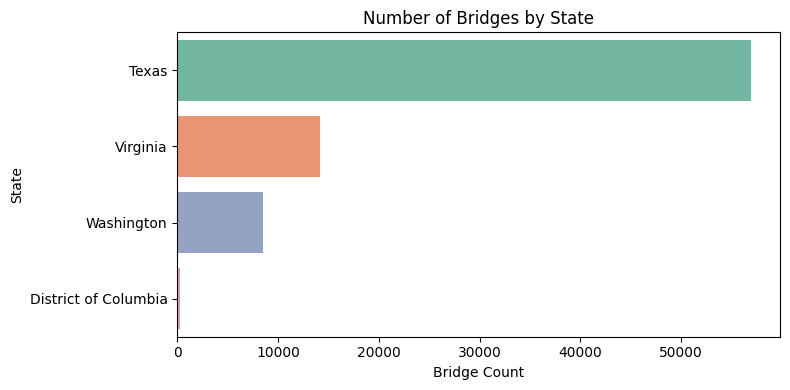

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Compute counts
state_counts = (
    df_pd["1___State_Name"]
    .value_counts()
    .reset_index()
)
state_counts.columns = ["state_name", "bridge_count"]

# Sort largest to smallest
state_counts = state_counts.sort_values(by="bridge_count", ascending=False)

# Print table of count of bridges per state 
display(state_counts)

# Plot
plt.figure(figsize=(8, 4))
ax = sns.barplot(
    data=state_counts,
    y="state_name",
    x="bridge_count",
    hue="state_name",
    palette="Set2",
    legend=False
)

plt.title("Number of Bridges by State")
plt.xlabel("Bridge Count")
plt.ylabel("State")
plt.tight_layout()
plt.show()



### **Top 6 Material Counts Across Texas, Virginia, Washington and District of Columbia**

,material,bridge_count
0,Concrete,35177
1,Prestressed Concrete,23591
2,Steel,9936
3,Steel Continuous,4793
4,Concrete Continuous,3693
5,Prestressed Concrete Continuous,1543


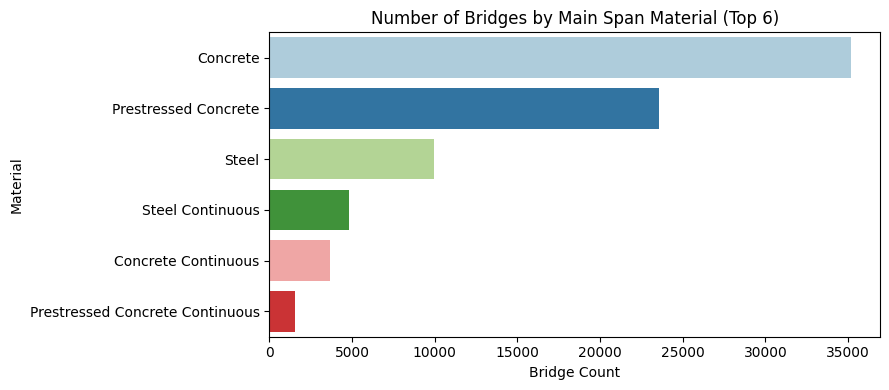

In [0]:
# Top 6 Materials
top_n = 6
top_materials = (
    df_pd["43A___Main_Span_Material"]
    .value_counts()
    .head(top_n)
    .index
)

df_top = df_pd[df_pd["43A___Main_Span_Material"].isin(top_materials)]

# Table
material_counts = (
    df_top["43A___Main_Span_Material"]
    .value_counts()
    .reset_index()
)
material_counts.columns = ["material", "bridge_count"]
material_counts = material_counts.sort_values(
    by="bridge_count", ascending=False
)

display(material_counts)

# Horizontal barplot
plt.figure(figsize=(9, 4))
sns.barplot(
    data=material_counts,
    y="material",
    x="bridge_count",
    hue = "material",
    legend= False,
    palette="Paired"
)

plt.title("Number of Bridges by Main Span Material (Top 6)")
plt.xlabel("Bridge Count")
plt.ylabel("Material")
plt.tight_layout()
plt.show()

### **Top 6 Material Counts in Virginia**

,material,bridge_count
0,Concrete,5239
1,Steel,5024
2,Prestressed Concrete,1641
3,Steel Continuous,1542
4,Concrete Continuous,323
5,Prestressed Concrete Continuous,223


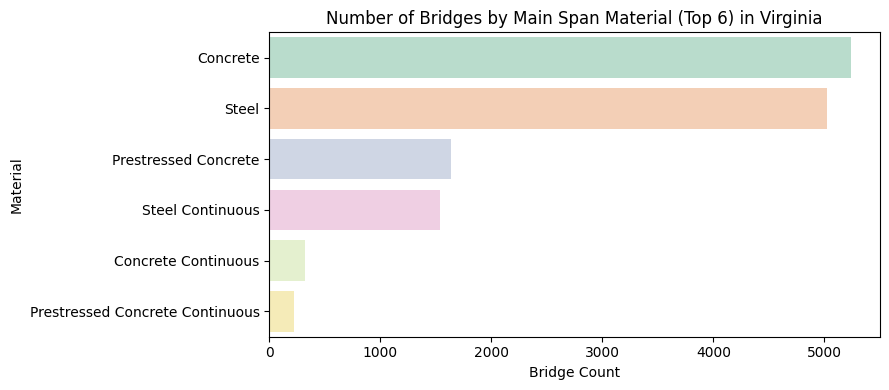

In [0]:
# Filter for data with state name 'Virginia'    
df_pd_va = df_pd[df_pd["1___State_Name"] == "Virginia"]

# Top 6 Materials in Virginia
top_materials_va = (
    df_pd_va["43A___Main_Span_Material"]
    .value_counts()
    .head(top_n)
    .index
)

df_top_va = df_pd_va[df_pd_va["43A___Main_Span_Material"].isin(top_materials_va)]

# Table
material_counts = (
    df_top_va["43A___Main_Span_Material"]
    .value_counts()
    .reset_index()
)
material_counts.columns = ["material", "bridge_count"]
material_counts = material_counts.sort_values(
    by="bridge_count", ascending=False
)

display(material_counts)                

# Horizontal barplot
plt.figure(figsize=(9, 4))
sns.barplot(
    data=material_counts,
    y="material",
    x="bridge_count",
    hue = "material",
    legend= False,
    palette="Pastel2"
)

plt.title("Number of Bridges by Main Span Material (Top 6) in Virginia")
plt.xlabel("Bridge Count")
plt.ylabel("Material")
plt.tight_layout()
plt.show()


### **Top 6 Material Counts in Texas**

,material,bridge_count
0,Concrete,28444
1,Prestressed Concrete,19207
2,Steel,3830
3,Steel Continuous,2982
4,Concrete Continuous,1700
5,Wood or Timber,287


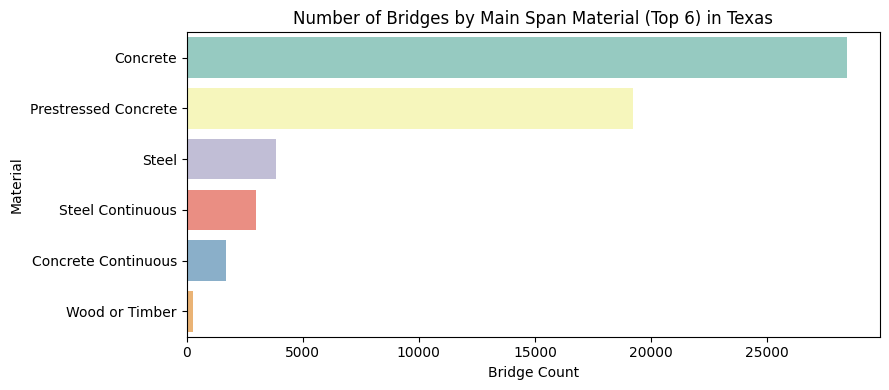

In [0]:
# Filter for data with State Name 'Texas'
df_pd_tx = df_pd[df_pd["1___State_Name"] == "Texas"]

# Top 6 Materials in Texas
top_materials_tx = (
    df_pd_tx["43A___Main_Span_Material"]
    .value_counts()
    .head(top_n)
    .index
)

df_top_tx = df_pd_tx[df_pd_tx["43A___Main_Span_Material"].isin(top_materials_tx)]

# Table
material_counts = (
    df_top_tx["43A___Main_Span_Material"]
    .value_counts()
    .reset_index()
)
material_counts.columns = ["material", "bridge_count"]
material_counts = material_counts.sort_values(
    by="bridge_count", ascending=False
)

display(material_counts)                

# Horizontal barplot
plt.figure(figsize=(9, 4))
sns.barplot(
    data=material_counts,
    y="material",
    x="bridge_count",
    hue = "material",
    legend= False,
    palette="Set3"
)

plt.title("Number of Bridges by Main Span Material (Top 6) in Texas")
plt.xlabel("Bridge Count")
plt.ylabel("Material")
plt.tight_layout()
plt.show()

### **Top 6 Material Counts in Washington**

,material,bridge_count
0,Prestressed Concrete,2715
1,Concrete Continuous,1645
2,Concrete,1454
3,Prestressed Concrete Continuous,1035
4,Steel,962
5,Wood or Timber,452


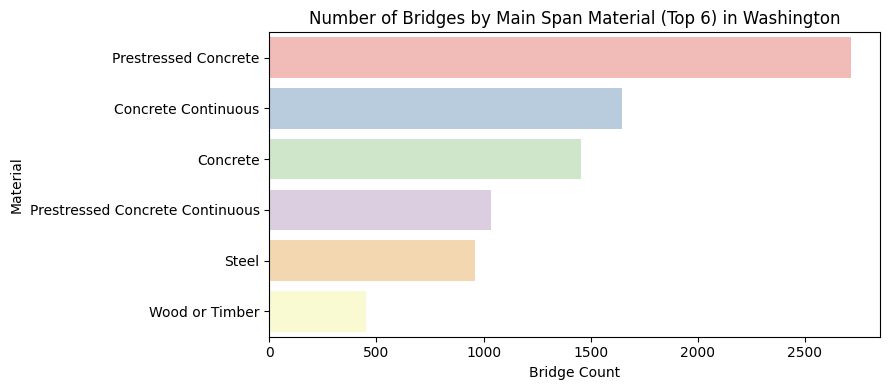

In [0]:
# Filter for data with State Name 'Washington'
df_pd_wa = df_pd[df_pd["1___State_Name"] == "Washington"]

# Top 6 Materials in Washington
top_materials_wa = (
    df_pd_wa["43A___Main_Span_Material"]
    .value_counts()
    .head(top_n)
    .index
)

df_top_wa = df_pd_wa[df_pd_wa["43A___Main_Span_Material"].isin(top_materials_wa)]

# Table
material_counts = (
    df_top_wa["43A___Main_Span_Material"]
    .value_counts()
    .reset_index()
)
material_counts.columns = ["material", "bridge_count"]
material_counts = material_counts.sort_values(
    by="bridge_count", ascending=False
)

display(material_counts)                

# Horizontal barplot
plt.figure(figsize=(9, 4))
sns.barplot(
    data=material_counts,
    y="material",
    x="bridge_count",
    hue = "material",
    legend= False,
    palette="Pastel1"
)

plt.title("Number of Bridges by Main Span Material (Top 6) in Washington")
plt.xlabel("Bridge Count")
plt.ylabel("Material")
plt.tight_layout()
plt.show()

### **Top 6 Material Counts in District of Columbia**

,material,bridge_count
0,Steel,120
1,Steel Continuous,45
2,Concrete,40
3,Prestressed Concrete,28
4,Concrete Continuous,25
5,Other Material Main Span OR No Approach or Sec...,1


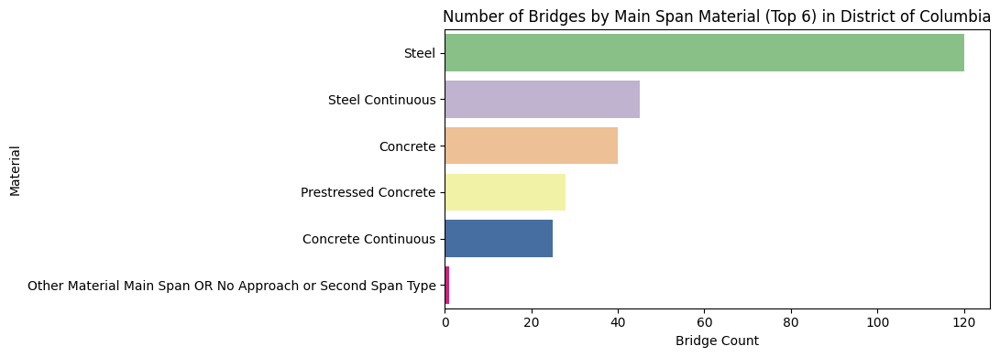

In [0]:
# Filter for data with State Name 'District of Columbia'
df_pd_dc = df_pd[df_pd["1___State_Name"] == "District of Columbia"]

# Top 6 Materials in DC
top_materials_dc = (
    df_pd_dc["43A___Main_Span_Material"]
    .value_counts()
    .head(top_n)
    .index
)

df_top_dc = df_pd_dc[df_pd_dc["43A___Main_Span_Material"].isin(top_materials_dc)]

# Table
material_counts = (
    df_top_dc["43A___Main_Span_Material"]
    .value_counts()
    .reset_index()
)
material_counts.columns = ["material", "bridge_count"]
material_counts = material_counts.sort_values(
    by="bridge_count", ascending=False
)

display(material_counts)                

# Horizontal barplot
plt.figure(figsize=(11, 4))
sns.barplot(
    data=material_counts,
    y="material",
    x="bridge_count",
    hue="material",
    legend=False,
    palette="Accent"
)

plt.title("Number of Bridges by Main Span Material (Top 6) in District of Columbia")
plt.xlabel("Bridge Count")
plt.ylabel("Material")
plt.tight_layout()
plt.show()


### **Top 6 Design Counts Across Texas, Virginia, Washington and District of Columbia**

,design,bridge_count
0,Stringer/Multi-beam or Girder,35554
1,Culvert,25274
2,Slab,7776
3,Box Beam or Girders - Multiple,4108
4,Tee Beam,3036
5,Other Main Design /Construction OR No Approach...,1588


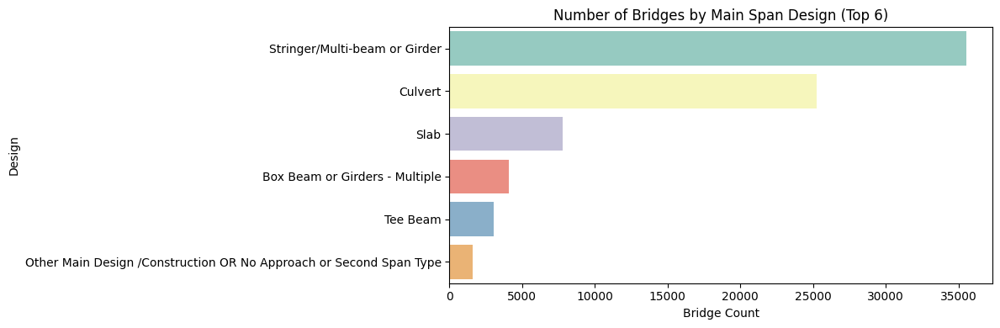

In [0]:
# Top 6 Designs
top_n = 6
top_designs = (
    df_pd["43B___Main_Span_Design"]
    .value_counts()
    .head(top_n)
    .index
)

df_top1 = df_pd[df_pd["43B___Main_Span_Design"].isin(top_designs)]

# Table
design_counts = (
    df_top1["43B___Main_Span_Design"]
    .value_counts()
    .reset_index()
)
design_counts.columns = ["design", "bridge_count"]
design_counts = design_counts.sort_values(
    by="bridge_count", ascending=False
)

display(design_counts)

# Horizontal barplot
plt.figure(figsize=(12, 4))
sns.barplot(
    data=design_counts,
    y="design",
    x="bridge_count",
    hue="design",
    legend=False,
    palette="Set3"
)

plt.title("Number of Bridges by Main Span Design (Top 6)")
plt.xlabel("Bridge Count")
plt.ylabel("Design")
plt.tight_layout()
plt.show()


### **Top 6 Design Counts for Virginia**

,design,bridge_count
0,Stringer/Multi-beam or Girder,6699
1,Culvert,3255
2,Slab,2115
3,Tee Beam,833
4,Box Beam or Girders - Multiple,497
5,Arch - Deck,276


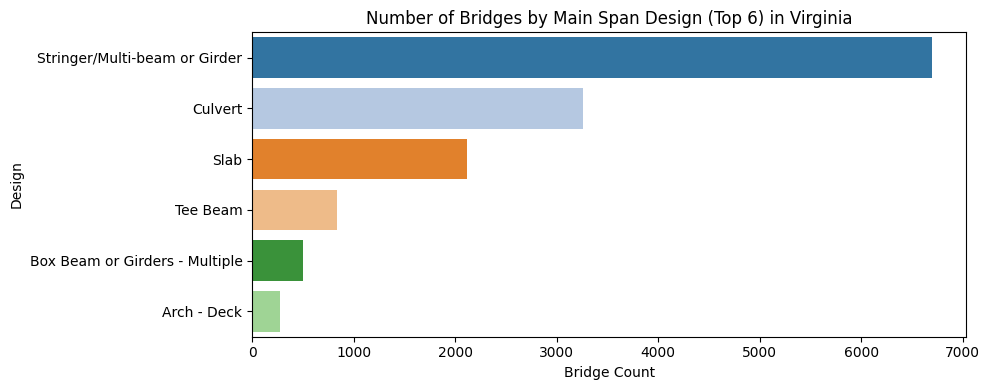

In [0]:
# Use df_pd_va to to find top 6 material in VA
# Top 6 Design in VA
top_designs_va = (
    df_pd_va["43B___Main_Span_Design"]
    .value_counts()
    .head(top_n)
    .index
)
df_top_va1 = df_pd_va[df_pd_va["43B___Main_Span_Design"].isin(top_designs_va)]

# Table
design_counts = (
    df_top_va1["43B___Main_Span_Design"]
    .value_counts()
    .reset_index()
)
design_counts.columns = ["design", "bridge_count"]
design_counts = design_counts.sort_values(
    by="bridge_count", ascending=False
)

display(design_counts)

# Horizontal barplot
plt.figure(figsize=(10, 4))
sns.barplot(
    data=design_counts,
    y="design",
    x="bridge_count",
    hue="design",
    legend=False,
    palette="tab20"
)

plt.title("Number of Bridges by Main Span Design (Top 6) in Virginia")
plt.xlabel("Bridge Count")
plt.ylabel("Design")
plt.tight_layout()
plt.show()

### **Top 6 Design Counts for Washington**

,design,bridge_count
0,Stringer/Multi-beam or Girder,3534
1,Slab,1500
2,Tee Beam,1065
3,Culvert,617
4,Box Beam or Girders - Multiple,616
5,Channel Beam,327


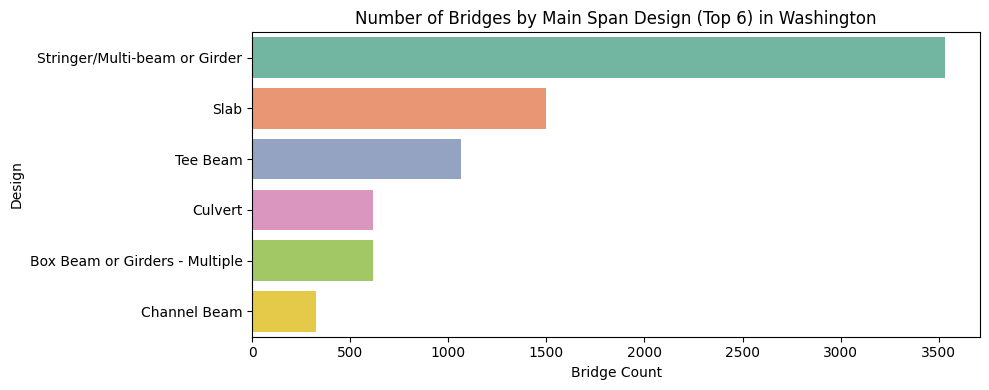

In [0]:
# Use df_pd_wa to find top 6 design in WA
# Top 6 Design in WA
top_designs_wa = (
    df_pd_wa["43B___Main_Span_Design"]
    .value_counts()
    .head(top_n)
    .index
)
df_top_wa1 = df_pd_wa[df_pd_wa["43B___Main_Span_Design"].isin(top_designs_wa)]

# Table
design_counts = (
    df_top_wa1["43B___Main_Span_Design"]
    .value_counts()
    .reset_index()
)
design_counts.columns = ["design", "bridge_count"]
design_counts = design_counts.sort_values(
    by="bridge_count", ascending=False
)

display(design_counts)

# Horizontal barplot
plt.figure(figsize=(10, 4))
sns.barplot(
    data=design_counts,
    y="design",
    x="bridge_count",
    hue="design",
    legend=False,
    palette="Set2"
)

plt.title("Number of Bridges by Main Span Design (Top 6) in Washington")
plt.xlabel("Bridge Count")
plt.ylabel("Design")
plt.tight_layout()
plt.show()

### **Top 6 Design Counts for Texas**

,design,bridge_count
0,Stringer/Multi-beam or Girder,25157
1,Culvert,21395
2,Slab,4159
3,Box Beam or Girders - Multiple,2985
4,Other Main Design /Construction OR No Approach...,1534
5,Tee Beam,1131


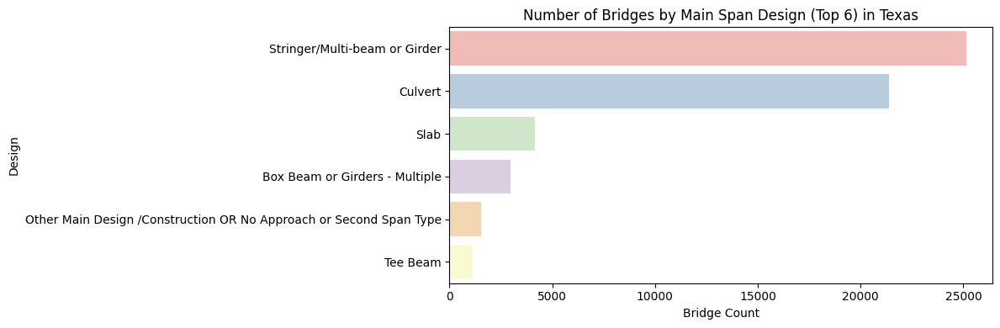

In [0]:
# Use df_pd_tx to find top 6 design in TX
# Top 6 Design in TX
top_designs_tx = (
    df_pd_tx["43B___Main_Span_Design"]
    .value_counts()
    .head(top_n)
    .index
)
df_top_tx1 = df_pd_tx[df_pd_tx["43B___Main_Span_Design"].isin(top_designs_tx)]

# Table
design_counts = (
    df_top_tx1["43B___Main_Span_Design"]
    .value_counts()
    .reset_index()
)
design_counts.columns = ["design", "bridge_count"]
design_counts = design_counts.sort_values(
    by="bridge_count", ascending=False
)

display(design_counts)

# Horizontal barplot
plt.figure(figsize=(12, 4))
sns.barplot(
    data=design_counts,
    y="design",
    x="bridge_count",
    hue="design",
    legend=False,
    palette="Pastel1"
)

plt.title("Number of Bridges by Main Span Design (Top 6) in Texas")
plt.xlabel("Bridge Count")
plt.ylabel("Design")
plt.tight_layout()
plt.show()

### **Top 6 Design Counts for District of Columbia**

,design,bridge_count
0,Stringer/Multi-beam or Girder,164
1,Girder and Floorbeam System,23
2,Frame,21
3,Arch - Deck,18
4,Box Beam or Girders - Multiple,10
5,Culvert,7


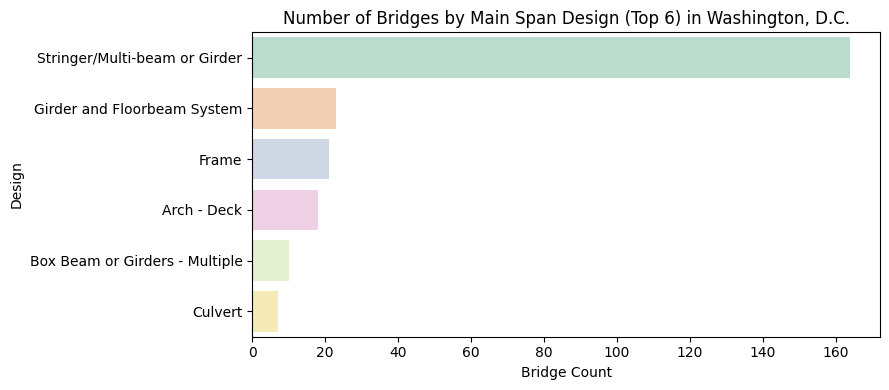

In [0]:
# Use df_pd_dc to find top 6 design in DC
# Top 6 Design in DC
top_designs_dc = (
    df_pd_dc["43B___Main_Span_Design"]
    .value_counts()
    .head(top_n)
    .index
)
df_top_dc1 = df_pd_dc[df_pd_dc["43B___Main_Span_Design"].isin(top_designs_dc)]

# Table
design_counts = (
    df_top_dc1["43B___Main_Span_Design"]
    .value_counts()
    .reset_index()
)
design_counts.columns = ["design", "bridge_count"]
design_counts = design_counts.sort_values(
    by="bridge_count", ascending=False
)

display(design_counts)

# Horizontal barplot
plt.figure(figsize=(9, 4))
sns.barplot(
    data=design_counts,
    y="design",
    x="bridge_count",
    hue="design",
    legend=False,
    palette="Pastel2"
)

plt.title("Number of Bridges by Main Span Design (Top 6) in Washington, D.C.")
plt.xlabel("Bridge Count")
plt.ylabel("Design")
plt.tight_layout()
plt.show()

## **Bivariate Analysis**

### **Which material-design combinations appear most often?**

In [0]:
# 1. Group the DataFrame by both material and design columns
# 2. Count the number of bridges for each material-design combination
# 3. Reset the index to turn the groupby result into a DataFrame
# 4. Sort the combinations by count in descending order

material_design_counts = (
    df_pd
    .groupby(
        ['43A___Main_Span_Material', '43B___Main_Span_Design']
    )
    .size()
    .reset_index(name='count')
    .sort_values('count', ascending=False)
)

# 5. Display the top 15 most frequent material-design combinations
display(material_design_counts.head(15))

,43A___Main_Span_Material,43B___Main_Span_Design,count
10,Concrete,Culvert,23536
49,Prestressed Concrete,Stringer/Multi-beam or Girder,16708
77,Steel,Stringer/Multi-beam or Girder,7640
16,Concrete,Stringer/Multi-beam or Girder,4738
91,Steel Continuous,Stringer/Multi-beam or Girder,4461
15,Concrete,Slab,3616
38,Prestressed Concrete,Box Beam or Girders - Multiple,3263
27,Concrete Continuous,Slab,2364
17,Concrete,Tee Beam,2006
47,Prestressed Concrete,Slab,1682


/home/spark-f6db1fc5-9ed0-453c-a486-fe/.ipykernel/3914/command-8467456862148163-3504308096:23: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


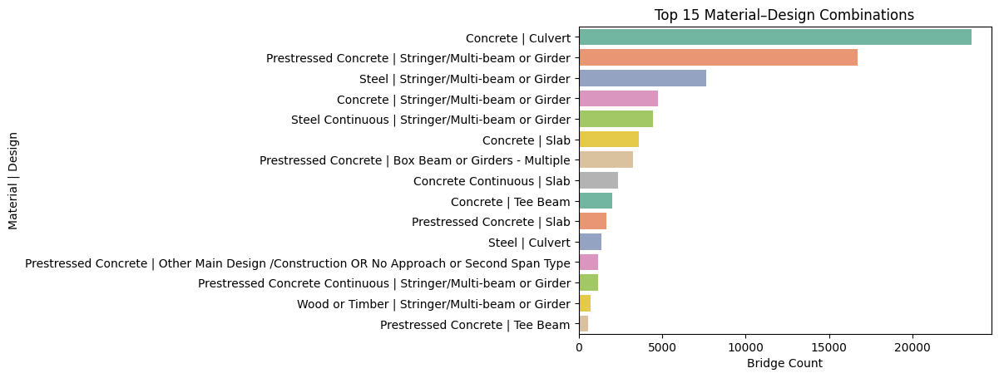

In [0]:
top15 = material_design_counts.sort_values(
    by="count", ascending=False
).head(15)

top15["combo"] = (
    top15["43A___Main_Span_Material"]
    + " | "
    + top15["43B___Main_Span_Design"]
)

sns.barplot(
    data=top15,
    x="count",
    y="combo",
    hue="combo",
    legend=False,
    palette="Set2"
)

plt.title("Top 15 Material–Design Combinations")
plt.xlabel("Bridge Count")
plt.ylabel("Material | Design")
plt.tight_layout()
plt.show()


### For each material, what percentage of bridges use each design across all states?

In [0]:
# 1. Calculate total bridge count for each material
material_totals = (
    df_pd
    .groupby('43A___Main_Span_Material')
    .size()
    .rename('total')
    .reset_index()
)

# 2. Merge material-design counts with material totals
material_design_pct = material_design_counts.merge(
    material_totals,
    on='43A___Main_Span_Material'
)

# 3. Calculate percentage of each material-design combination
material_design_pct['percent'] = (
    material_design_pct['count'] /
    material_design_pct['total']
) * 100

# Sort material-design combinations by highest percentage
material_design_pct_sorted = material_design_pct.sort_values(by='percent', ascending=False)

# Display the sorted results
display(material_design_pct_sorted[['43A___Main_Span_Material', '43B___Main_Span_Design', 'percent']])

,43A___Main_Span_Material,43B___Main_Span_Design,percent
4,Steel Continuous,Stringer/Multi-beam or Girder,93.073232
13,Wood or Timber,Stringer/Multi-beam or Girder,92.550505
29,"Aluminum, Wrought Iron or Cast Iron",Culvert,85.123967
28,Masonry,Culvert,83.206107
2,Steel,Stringer/Multi-beam or Girder,76.892110
...,...,...,...
103,Steel,Slab,0.010064
104,Steel,Channel Beam,0.010064
93,Prestressed Concrete,Stayed Girder,0.008478
100,Prestressed Concrete,Movable - Swing,0.004239


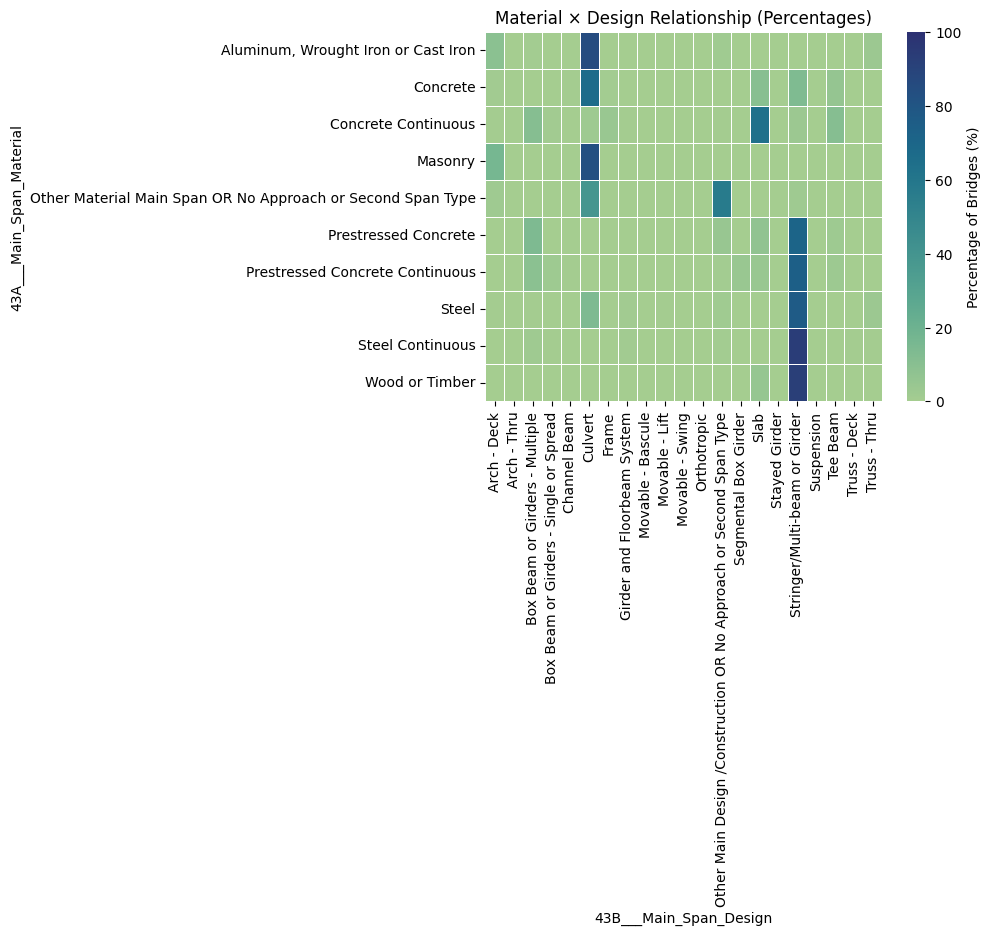

In [0]:
pivot_pct = material_design_pct.pivot(
    index='43A___Main_Span_Material',
    columns='43B___Main_Span_Design',
    values='percent'
).fillna(0)

sns.heatmap(
    pivot_pct,
    cmap= "crest",
    vmin=0,
    vmax=100,
    linewidths=.5,
    cbar_kws={"label": "Percentage of Bridges (%)"}
)
plt.title("Material × Design Relationship (Percentages)")
plt.show()



##**Material and Design Association Rule Across Different States**

In [0]:
# Transfer data from pandas back to Spark
df2 = spark.createDataFrame(df_pd)
display(df2)

1___State_Code,1___State_Name,8___Structure_Number,22___Owner_Agency,43A___Main_Span_Material,43B___Main_Span_Design
11,District of Columbia,0132,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0027,State Highway Agency,Steel,Arch - Deck
11,District of Columbia,0196,State Highway Agency,Prestressed Concrete,Box Beam or Girders - Multiple
11,District of Columbia,0204,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0129,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0070,State Highway Agency,Prestressed Concrete,Box Beam or Girders - Multiple
11,District of Columbia,0222,State Highway Agency,Steel,Stringer/Multi-beam or Girder
11,District of Columbia,0045,State Highway Agency,Steel Continuous,Stringer/Multi-beam or Girder
11,District of Columbia,0128,State Highway Agency,Concrete,Stringer/Multi-beam or Girder
11,District of Columbia,0065,State Highway Agency,Steel,Stringer/Multi-beam or Girder


In [0]:
from pyspark.sql import functions as F

# Define the name for material and design columns
material_col = "43A___Main_Span_Material"
design_col   = "43B___Main_Span_Design"

# Select relevant columns, drop rows with nulls, and standardize text (lowercase, trimmed)
# Standardizing text ensures that values like "Steel", "steel", " STEEL " are treated as the same category.
df_md = (
    df2.select(material_col, design_col)
       .dropna()
       .withColumn(material_col, F.lower(F.trim(F.col(material_col))))
       .withColumn(design_col,   F.lower(F.trim(F.col(design_col))))
)

# Count total number of rows (bridges)
N = df_md.count()
print("Transactions (bridges):", N)

Transactions (bridges): 79872


In [0]:
# Count occurrences of each (material, design) pair
pair_counts = (
    df_md.groupBy(material_col, design_col)
         .count()
         .withColumnRenamed("count", "pair_count")
)

# Count occurrences of each material
mat_counts = (
    df_md.groupBy(material_col)
         .count()
         .withColumnRenamed("count", "mat_count")
)

# Count occurrences of each design
des_counts = (
    df_md.groupBy(design_col)
         .count()
         .withColumnRenamed("count", "des_count")
)

In [0]:
# Calculate association metrics between material and design pairs:
# - support: fraction of all bridges with this material-design pair
# - confidence: fraction of bridges with this material that use this design
# - lift: how much more likely the pair is than expected by chance

rules = (
    pair_counts
    .join(mat_counts, on=material_col, how="inner")   # Add material counts for each material
    .join(des_counts, on=design_col, how="inner")     # Add design counts for each design
    .withColumn("support",    F.col("pair_count") / F.lit(N))                   # Fraction of all bridges with this pair
    .withColumn("confidence", F.col("pair_count") / F.col("mat_count"))         # P(design | material): probability of design given material
    .withColumn("lift",       (F.col("pair_count") / F.col("mat_count")) /
                             (F.col("des_count") / F.lit(N)))                   # confidence / P(design): strength of association
    .select(
        material_col,
        design_col,
        "pair_count",
        "support",
        "confidence",
        "lift"
    )
)

In [0]:
display (rules)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
concrete continuous,tee beam,418,0.005233373397435897,0.1131871107500677,2.9777605104839946
concrete continuous,box beam or girders - single or spread,48,6.009615384615385E-4,0.012997562956945572,5.865205358740998
steel,truss - thru,344,0.004306891025641026,0.03462157809983897,7.374119162640902
prestressed concrete,box beam or girders - multiple,3263,0.040852864583333336,0.13831545928532069,2.6892727273702857
concrete continuous,frame,165,0.0020658052884615385,0.04467912266450041,6.6578561295876435
steel continuous,other main design /construction or no approach or second span type,52,6.510416666666666E-4,0.010849155017734195,0.5456824367609986
prestressed concrete continuous,slab,70,8.764022435897436E-4,0.04536616979909268,0.4659833737388285
steel,arch - thru,25,3.130008012820513E-4,0.0025161030595813203,4.78490913273522
prestressed concrete,slab,1682,0.021058693910256412,0.07129837649951253,0.732348756143141
other material main span or no approach or second span type,culvert,37,4.632411858974359E-4,0.3894736842105263,1.2308317680328857


In [0]:
# Filter material-design association rules for strong relationships:
# - support >= 0.01: at least 1% of all bridges have this pair
# - confidence >= 0.30: at least 30% of bridges with this material use this design
# - lift >= 1.10: the pair occurs at least 10% more often than expected by chance
# Then, sort by lift (strength of association), confidence, and support (all descending)

best_rules = (
    rules
    .filter((F.col("support") >= 0.01) & (F.col("confidence") >= 0.30) & (F.col("lift") >= 1.10))
    .orderBy(F.desc("lift"), F.desc("confidence"), F.desc("support"))
)

display(best_rules)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
concrete continuous,slab,2364,0.029597355769230768,0.6401299756295694,6.575162218812367
concrete,culvert,23536,0.29467147435897434,0.6690735423714359,2.1144354663405602
steel continuous,stringer/multi-beam or girder,4461,0.05585186298076923,0.930732317963697,2.09088855544795
steel,stringer/multi-beam or girder,7640,0.09565304487179487,0.7689210950080515,1.7273799206976175
prestressed concrete continuous,stringer/multi-beam or girder,1148,0.014372996794871794,0.7440051847051199,1.6714063709503104
prestressed concrete,stringer/multi-beam or girder,16708,0.2091846955128205,0.7082361917680471,1.5910513896860397


In [0]:
from pyspark.sql.window import Window

# Define a window partitioned by material, ordered by lift descending
w = Window.partitionBy(material_col).orderBy(F.desc("lift"))

# For each material, select the top 1 rules with highest lift
top_rules_per_material = (
    rules
    .withColumn("rank", F.row_number().over(w))  # Assign rank within each material group
    .filter(F.col("rank") <= 1)                  # Keep only top 1 per material
    .drop("rank")                                # Remove the rank column
)

display(top_rules_per_material)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
"aluminum, wrought iron or cast iron",arch - deck,11,1.3772035256410256E-4,0.09090909090909091,12.497574714442184
concrete,culvert,23536,0.29467147435897434,0.6690735423714359,2.1144354663405602
concrete continuous,frame,165,0.0020658052884615385,0.04467912266450041,6.6578561295876435
masonry,arch - deck,22,2.754407051282051E-4,0.16793893129770993,23.08712275492373
other material main span or no approach or second span type,other main design /construction or no approach or second span type,54,6.760817307692308E-4,0.5684210526315789,28.5900039771974
prestressed concrete,box beam or girders - multiple,3263,0.040852864583333336,0.13831545928532069,2.6892727273702857
prestressed concrete continuous,segmental box girder,67,8.388421474358974E-4,0.04342190537913156,43.90119527141768
steel,movable - bascule,21,2.6292067307692306E-4,0.002113526570048309,8.03864734299517
steel continuous,orthotropic,4,5.0080128205128203E-5,8.345503859795535E-4,11.109534738159816
wood or timber,suspension,3,3.7560096153846156E-5,0.003787878787878788,33.61616161616161


### **Material and Design Association Rule for District of Columbia**

In [0]:
# Material and Design for District of Columbia
# Filter for Material and Design for Bridges in DC

df_dc = df2.filter(F.col("1___State_Name") == "District of Columbia")
df_dc_md = (
    df_dc.select(material_col, design_col)
    .dropna()
    .withColumn(material_col, F.lower(F.trim(F.col(material_col))))
    .withColumn(design_col,   F.lower(F.trim(F.col(design_col))))
)

# Count total number of rows (bridges)
D = df_dc_md.count()
print("Transactions (DC bridges):", D)

# Count occurrences of each (material, design) pair
pair_counts_dc = (
    df_dc_md.groupBy(material_col, design_col)
         .count()
         .withColumnRenamed("count", "pair_count")
)

# Count occurrences of each material
mat_counts_dc = (
    df_dc_md.groupBy(material_col)
         .count()
         .withColumnRenamed("count", "mat_count")
)

# Count occurrences of each design
des_counts_dc = (
    df_dc_md.groupBy(design_col)
         .count()
         .withColumnRenamed("count", "des_count")
)

Transactions (DC bridges): 261


In [0]:
# Calculate association metrics between material and design pairs:
rules_dc = (
    pair_counts_dc
    .join(mat_counts_dc, on=material_col, how="inner")   # Add material counts
    .join(des_counts_dc, on=design_col, how="inner")     # Add design counts
    .withColumn("support",    F.col("pair_count") / F.lit(D))                   # Fraction of all bridges with this pair
    .withColumn("confidence", F.col("pair_count") / F.col("mat_count"))         # P(design | material)
    .withColumn("lift",       (F.col("pair_count") / F.col("mat_count")) /
                             (F.col("des_count") / F.lit(D)))                   # confidence / P(design)
    .select(
        material_col,
        design_col,
        "pair_count",
        "support",
        "confidence",
        "lift"
    )
)
display(rules_dc)


43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
prestressed concrete,box beam or girders - multiple,9,0.034482758620689655,0.32142857142857145,8.389285714285716
concrete continuous,frame,10,0.038314176245210725,0.4,4.9714285714285715
concrete,frame,11,0.0421455938697318,0.275,3.417857142857143
steel continuous,girder and floorbeam system,9,0.034482758620689655,0.2,2.2695652173913046
steel continuous,stringer/multi-beam or girder,36,0.13793103448275862,0.8,1.273170731707317
steel,arch - deck,1,0.0038314176245210726,0.008333333333333333,0.12083333333333333
steel,girder and floorbeam system,12,0.04597701149425287,0.1,1.1347826086956523
steel,stringer/multi-beam or girder,105,0.40229885057471265,0.875,1.392530487804878
concrete,stringer/multi-beam or girder,3,0.011494252873563218,0.075,0.11935975609756097
steel,arch - thru,1,0.0038314176245210726,0.008333333333333333,2.1750000000000003


In [0]:
# Filter material-design association rules for strong relationships:
# - support >= 0.01: at least 1% of all bridges have this pair
# - confidence >= 0.30: at least 30% of bridges with this material use this design
# - lift >= 1.10: the pair occurs at least 10% more often than expected by chance
# Then, sort by lift (strength of association), confidence, and support (all descending)

best_rules_dc = (
    rules_dc
    .filter((F.col("support") >= 0.01) & (F.col("confidence") >= 0.30) & (F.col("lift") >= 1.10))
    .orderBy(F.desc("lift"), F.desc("confidence"), F.desc("support"))
)

display(best_rules_dc)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
prestressed concrete,box beam or girders - multiple,9,0.034482758620689655,0.32142857142857145,8.389285714285716
concrete continuous,frame,10,0.038314176245210725,0.4,4.9714285714285715
steel,stringer/multi-beam or girder,105,0.40229885057471265,0.875,1.392530487804878
steel continuous,stringer/multi-beam or girder,36,0.13793103448275862,0.8,1.273170731707317


### **Material and Design Association Rule in Texas**

In [0]:
# Material and Design for Texas
# Filter out Material and Design for bridges in TX
df_tx = df2.filter(F.col("1___State_Name") == "Texas")
df_tx_md = (
    df_tx.select(material_col, design_col)
    .dropna()
    .withColumn(material_col, F.lower(F.trim( F.col(material_col))))
    .withColumn(design_col,   F.lower(F.trim(F.col(design_col))))
)

# Count total number of rows (bridges)
T = df_tx_md.count()
print("Transactions (TX bridges):", T)

# Count occurrences of each (material, design) pair
pair_counts_tx = (
    df_tx_md.groupBy(material_col, design_col)
         .count()
         .withColumnRenamed("count", "pair_count")
)

# Count occurrences of each material
mat_counts_tx = (
    df_tx_md.groupBy(material_col)
         .count()
         .withColumnRenamed("count", "mat_count")
)

# Count occurrences of each design
des_counts_tx = (
    df_tx_md.groupBy(design_col)
         .count()
         .withColumnRenamed("count", "des_count")
)                           

Transactions (TX bridges): 56949


In [0]:
# Calculate association metrics between material and design pairs:
rules_tx = (
    pair_counts_tx
    .join(mat_counts_tx, on=material_col, how="inner")   # Add material counts
    .join(des_counts_tx, on=design_col, how="inner")     # Add design counts
    .withColumn("support",    F.col("pair_count") / F.lit(T))                   # Fraction of all bridges with this pair
    .withColumn("confidence", F.col("pair_count") / F.col("mat_count"))         # P(design | material)
    .withColumn("lift",       (F.col("pair_count") / F.col("mat_count")) /
                             (F.col("des_count") / F.lit(T)))                   # confidence / P(design)
    .select(
        material_col,
        design_col,
        "pair_count",
        "support",
        "confidence",
        "lift"
    )
)
display(rules_tx)
                                                                                                                                                                                                                                                                                                                     

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
concrete continuous,box beam or girders - single or spread,2,3.511914168817714E-5,0.001176470588235294,1.2641287458379578
prestressed concrete continuous,box beam or girders - multiple,6,1.0535742506453143E-4,0.02112676056338028,0.4030646188689928
other material main span or no approach or second span type,other main design /construction or no approach or second span type,53,9.306572547366942E-4,0.7681159420289855,28.515928802222096
steel continuous,truss - thru,7,1.2291699590862E-4,0.002347417840375587,1.2493747531920496
prestressed concrete,stayed girder,1,1.755957084408857E-5,5.206435153850159E-5,2.965012755766127
steel,movable - bascule,1,1.755957084408857E-5,2.610966057441253E-4,14.869190600522192
wood or timber,suspension,1,1.755957084408857E-5,0.003484320557491289,49.607142857142854
"aluminum, wrought iron or cast iron",other main design /construction or no approach or second span type,2,3.511914168817714E-5,0.08,2.969960886571056
concrete,channel beam,4,7.023828337635428E-5,1.406271972999578E-4,2.002144564758824
masonry,arch - deck,12,2.1071485012906285E-4,0.09917355371900827,31.37685950413223


In [0]:
# Filter material-design association rules for strong relationships:
# - support >= 0.01: at least 1% of all bridges have this pair
# - confidence >= 0.30: at least 30% of bridges with this material use this design
# - lift >= 1.10: the pair occurs at least 10% more often than expected by chance
# Then, sort by lift (strength of association), confidence, and support (all descending)

best_rules_tx = (
    rules_tx
    .filter((F.col("support") >= 0.01) & (F.col("confidence") >= 0.30) & (F.col("lift") >= 1.10))
    .orderBy(F.desc("lift"), F.desc("confidence"), F.desc("support"))
)

display(best_rules_tx)
       

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
concrete continuous,slab,1513,0.026567630687106006,0.89,12.18672998316903
steel continuous,stringer/multi-beam or girder,2776,0.04874536866318987,0.9309188464118041,2.1073616641215502
concrete,culvert,20731,0.36402746316880014,0.7288356068063564,1.9400074303349002
prestressed concrete,stringer/multi-beam or girder,14546,0.25542151749811237,0.7573280574790441,1.7143966110972724
steel,stringer/multi-beam or girder,2896,0.0508525171644805,0.7561357702349869,1.7116975783723127


### **Material and Design Association Rule in Virginia**

In [0]:
# Material and Design for Virginia
# Filter for Material and Design for Bridges in Virginia
df_va = df2.filter(F.col("1___State_Name") == "Virginia")
df_va_md = (
    df_va.select(material_col, design_col)
    .dropna()
    .withColumn(material_col, F.lower(F.trim(F.col(material_col))))
    .withColumn(design_col,   F.lower(F.trim(F.col(design_col))))
)

# Count total number of rows (bridges)
V = df_va_md.count()
print("Transactions (VA bridges):", V)

# Count occurrences of each (material, design) pair
pair_counts_va = (
    df_va_md.groupBy(material_col, design_col)
         .count()
         .withColumnRenamed("count", "pair_count")
)

# Count occurrences of each material
mat_counts_va = (
    df_va_md.groupBy(material_col)
         .count()
         .withColumnRenamed("count", "mat_count")
)

# Count occurrences of each design
des_counts_va = (
    df_va_md.groupBy(design_col)
         .count()
         .withColumnRenamed("count", "des_count")
)                                                                                                                                                            

Transactions (VA bridges): 14143


In [0]:
# Calculate association metrics between material and design pairs:
rules_va = (
    pair_counts_va
    .join(mat_counts_va, on=material_col, how="inner")   # Add material counts
    .join(des_counts_va, on=design_col, how="inner")     # Add design counts
    .withColumn("support",    F.col("pair_count") / F.lit(V))                   # Fraction of all bridges with this pair
    .withColumn("confidence", F.col("pair_count") / F.col("mat_count"))         # P(design | material)
    .withColumn("lift",       (F.col("pair_count") / F.col("mat_count")) /
                             (F.col("des_count") / F.lit(V)))                   # confidence / P(design)
    .select(
        material_col,
        design_col,
        "pair_count",
        "support",
        "confidence",
        "lift"
    )
)
display(rules_va)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
steel,truss - thru,104,0.007353461076150746,0.020700636942675158,2.661537348002316
concrete continuous,tee beam,18,0.0012727144170260906,0.05572755417956656,0.9461642242036133
prestressed concrete,box beam or girders - multiple,409,0.028918899809092836,0.24923826934795856,7.092508739211625
concrete continuous,frame,21,0.001484833486530439,0.06501547987616099,3.929546717472414
prestressed concrete,slab,541,0.038252138867284166,0.32967702620353445,2.2045494948447226
other material main span or no approach or second span type,culvert,20,0.0014141271300289896,0.8695652173913043,3.7782675482535226
steel,movable - lift,3,2.1211906950434844E-4,5.971337579617834E-4,2.8150875796178343
"aluminum, wrought iron or cast iron",arch - deck,5,3.535317825072474E-4,0.07575757575757576,3.8820267896354856
concrete,girder and floorbeam system,4,2.828254260057979E-4,7.635044855888528E-4,0.15879770499534038
concrete,frame,192,0.0135756204482783,0.03664821530826494,2.2150243978837225


In [0]:
# Filter material-design association rules for strong relationships:
# - support >= 0.01: at least 1% of all bridges have this pair
# - confidence >= 0.30: at least 30% of bridges with this material use this design
# - lift >= 1.10: the pair occurs at least 10% more often than expected by chance
# Then, sort by lift (strength of association), confidence, and support (all descending)

best_rules_va = (
    rules_va
    .filter((F.col("support") >= 0.01) & (F.col("confidence") >= 0.30) & (F.col("lift") >= 1.10))
    .orderBy(F.desc("lift"), F.desc("confidence"), F.desc("support"))
)

display(best_rules_va)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
concrete continuous,slab,222,0.015696811143321783,0.6873065015479877,4.596016951013329
prestressed concrete,slab,541,0.038252138867284166,0.32967702620353445,2.2045494948447226
concrete,culvert,2553,0.18051332814820054,0.48730673792708534,2.1173515190484693
steel continuous,stringer/multi-beam or girder,1497,0.10584741568266987,0.9708171206225681,2.0495994233415407
prestressed concrete continuous,stringer/multi-beam or girder,203,0.014353390369794244,0.9103139013452914,1.9218643837477916
steel,stringer/multi-beam or girder,4231,0.29915859435763276,0.8421576433121019,1.7779721673926043


### **Material and Design Association Rule in Washington**

In [0]:
# Material and Design for Washington
# Filter for Material and Design for Bridges in Washington
df_wa = df2.filter(F.col("1___State_Name") == "Washington")
df_wa_md = (
    df_wa.select(material_col, design_col)
    .dropna()
    .withColumn(material_col, F.lower(F.trim(F.col(material_col))))
    .withColumn(design_col,   F.lower(F.trim(F.col(design_col))))
)

# Count total number of rows (bridges)
W = df_wa_md.count()
print("Transactions (WA bridges):", W)

# Count occurrences of each (material, design) pair
pair_counts_wa = (
    df_wa_md.groupBy(material_col, design_col)
         .count()
         .withColumnRenamed("count", "pair_count")
)

# Count occurrences of each material
mat_counts_wa = (
    df_wa_md.groupBy(material_col)
         .count()
         .withColumnRenamed("count", "mat_count")
)

# Count occurrences of each design
des_counts_wa = (
    df_wa_md.groupBy(design_col)
         .count()
         .withColumnRenamed("count", "des_count")
)                                                                                                                                                            

Transactions (WA bridges): 8519


In [0]:
# Calculate association metrics between material and design pairs:
rules_wa = (
    pair_counts_wa
    .join(mat_counts_wa, on=material_col, how="inner")   # Add material counts
    .join(des_counts_wa, on=design_col, how="inner")     # Add design counts
    .withColumn("support",    F.col("pair_count") / F.lit(W))                   # Fraction of all bridges with this pair
    .withColumn("confidence", F.col("pair_count") / F.col("mat_count"))         # P(design | material)
    .withColumn("lift",       (F.col("pair_count") / F.col("mat_count")) /
                             (F.col("des_count") / F.lit(W)))                   # confidence / P(design)
    .select(
        material_col,
        design_col,
        "pair_count",
        "support",
        "confidence",
        "lift"
    )
)
display(rules_wa)                                                                                                                                                                                                          

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
concrete continuous,segmental box girder,2,2.3476933912431035E-4,0.0012158054711246201,1.1508274231678488
prestressed concrete continuous,frame,3,3.5215400868646553E-4,0.002898550724637681,0.12045245669848004
other material main span or no approach or second span type,culvert,1,1.1738466956215518E-4,0.5,6.90356564019449
steel continuous,other main design /construction or no approach or second span type,1,1.1738466956215518E-4,0.004464285714285714,0.8844476744186046
steel,channel beam,1,1.1738466956215518E-4,0.0010395010395010396,0.027081068365472034
prestressed concrete,segmental box girder,1,1.1738466956215518E-4,3.6832412523020257E-4,0.34863924698178844
"aluminum, wrought iron or cast iron",culvert,30,0.0035215400868646553,1.0,13.80713128038898
wood or timber,arch - thru,1,1.1738466956215518E-4,0.0022123893805309734,0.8194497883801463
concrete,segmental box girder,1,1.1738466956215518E-4,6.87757909215956E-4,0.6510010698456365
concrete continuous,truss - deck,2,2.3476933912431035E-4,0.0012158054711246201,0.39836333878887076


In [0]:
# Filter material-design association rules for strong relationships:
# - support >= 0.01: at least 1% of all bridges have this pair
# - confidence >= 0.30: at least 30% of bridges with this material use this design
# - lift >= 1.10: the pair occurs at least 10% more often than expected by chance
# Then, sort by lift (strength of association), confidence, and support (all descending)

best_rules_wa = (
    rules_wa
    .filter((F.col("support") >= 0.01) & (F.col("confidence") >= 0.30) & (F.col("lift") >= 1.10))
    .orderBy(F.desc("lift"), F.desc("confidence"), F.desc("support"))
)

display(best_rules_wa)

43A___Main_Span_Material,43B___Main_Span_Design,pair_count,support,confidence,lift
wood or timber,stringer/multi-beam or girder,421,0.04941894588566733,0.9314159292035398,2.245255320001402
concrete continuous,slab,628,0.07371757248503345,0.3817629179331307,2.168158865248227
prestressed concrete continuous,stringer/multi-beam or girder,785,0.09214696560629182,0.7584541062801933,1.8283165057727693
steel continuous,stringer/multi-beam or girder,152,0.017842469773447587,0.6785714285714286,1.6357526881720432
prestressed concrete,stringer/multi-beam or girder,1513,0.17760300504754079,0.5572744014732965,1.3433561477507112
